<a href="https://colab.research.google.com/github/theaok/vis/blob/main/map.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os, zipfile
import pandas as pd
import matplotlib.pyplot as plt

#will display all output not just last command
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

### geopandas [if tight on time, just this]
https://geopandas.org/

a sister of pandas; does the job; tho not as fancy/interactive as folium or leafmap

just quick focus here on thematic/choloropleth maps: coloring polygons (states, counties, etc) with values of a var, say crime: green=low, red=hi

REFS (also good for self study):

https://geopandas.org/en/stable/gallery/choropleths.html

https://geopandas.org/en/stable/gallery/choro_legends.html

https://geopandas.org/en/stable/gallery/geopandas_rasterio_sample.html

In [2]:
! pip install geopandas 
import geopandas as gpd 

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
# say want to map housing values across nj counties; first need to get the map with counties
# (then we will get regular data with housing values and merge with counties data and color code the polygons)
# maps have their own files, a popular one is 'shapefile', so if you want to map nj counties
# first step is to get the geo data so google 'geography you're looking for + 'shapefile'', eg 'nj counties shapefile'
# i found one and put on my website; have it zipped as one shapefile consists of several files
# keep them in one zipped folder and dont change their names
! wget -q -O nj-counties.zip https://docs.google.com/uc?id=1xJDhcRCkgv7k4tNCa72Oog5bohV6dTB2&export=download
zip_ref = zipfile.ZipFile('nj-counties.zip', 'r'); zip_ref.extractall(); zip_ref.close() #just unzipping
njC=gpd.read_file('nj_counties.shp') #load the shapefile with gpd as njC

In [12]:
njC.dtypes #with geopandas can do stuff like with pandas :)

COUNTY          object
COUNTY_LAB      object
CO              object
GNIS_NAME       object
GNIS            object
FIPSSTCO        object
FIPSCO          object
ACRES          float64
SQ_MILES       float64
POP2010          int64
POP2000          int64
POP1990          int64
POP1980          int64
POPDEN2010       int64
POPDEN2000       int64
POPDEN1990       int64
POPDEN1980       int64
REGION          object
Shape_Leng     float64
Shape_Area     float64
geometry      geometry
dtype: object

In [11]:
njC.head(2)

,COUNTY,COUNTY_LAB,CO,GNIS_NAME,GNIS,FIPSSTCO,FIPSCO,ACRES,SQ_MILES,POP2010,...,POP1990,POP1980,POPDEN2010,POPDEN2000,POPDEN1990,POPDEN1980,REGION,Shape_Leng,Shape_Area,geometry
0,ATLANTIC,Atlantic County,ATL,County of Atlantic,882270,34001,1,390815.404215,610.649069,274549,...,275372,204615,450,414,451,335,COASTAL,650228.153906,1.702385e+10,"POLYGON ((443056.010 311529.770, 443068.440 31..."
1,BERGEN,Bergen County,BER,County of Bergen,882271,34003,3,153490.275182,239.828555,905116,...,829592,849843,3774,3686,3459,3544,NORTHEASTERN,443326.122021,6.686010e+09,"POLYGON ((656200.963 783614.366, 656141.127 78..."


<AxesSubplot:>

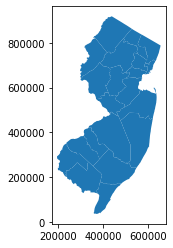

In [4]:
njC.plot() #yay love the shape

<AxesSubplot:>

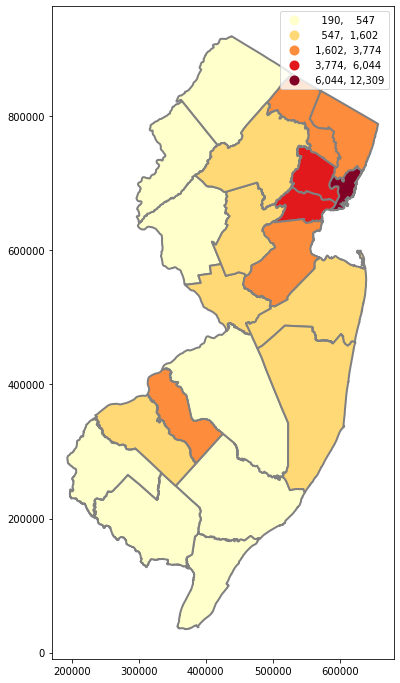

In [43]:
#sometimes lucky and have the variable we want to map in the shapefile
njC.plot(figsize=(10,12),column='POPDEN2010',legend=True,cmap='YlOrRd',scheme='natural_breaks',k=5, 
         edgecolor='grey',linewidth=2,legend_kwds= {"fmt": "{:,.0f}"}) #,ax=ax

<AxesSubplot:>

<AxesSubplot:>

[]

[]

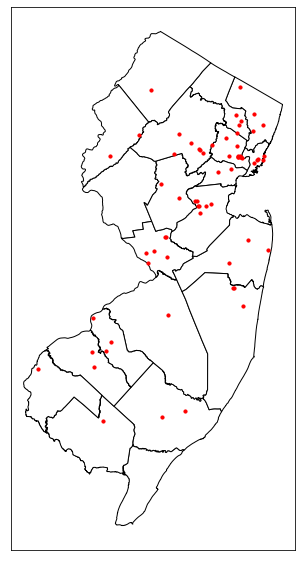

In [17]:
# we can overlay layers; lets get nj uni shapefile on it
!wget -q -O col.zip https://sites.google.com/site/adamokuliczkozaryn/gis_int/hsip_colleges.zip?attredirects=0&d=1
zip_ref = zipfile.ZipFile('col.zip', 'r');zip_ref.extractall(); zip_ref.close()

col = gpd.read_file('2007_11_30_NJ_COLL_UNIV_njsp.shp')
#col.dtypes

fig, ax = plt.subplots(1, figsize=(6,10))
njC.plot(ax=ax, color='white', edgecolor='black',linewidth=1)
col.plot(ax=ax, marker='o', color='red', markersize=10)
#col.plot(column='ENROLL',markersize=50,legend=True,cmap='RdYlGn_r',scheme='QUANTILES',k=5,ax=ax)
ax.set_xticks([]) #kills xticks
ax.set_yticks([]) #kills xticks
#ax.set_title('Watersheds by area ($mi^2$)')

In [19]:
#ok that was fun but remember we want to map housing prices
#but we dont have that info in counies shapefile :(
#so we need to find it elsewhere...and...merge!
#2nd dataset:  housing prices
!wget -q -O zillow.csv https://sites.google.com/site/adamokuliczkozaryn/gis_int/all_homes.csv
zillow=pd.read_csv('zillow.csv')
zillow.head(3)
zil1=zillow[['UPPER','Dec 2012']]
zil1.rename(columns={'UPPER': 'COUNTY'}, inplace=True) #fix col names to match 1st dataset

,UPPER,Data Type,Aug 2012,Sep 2012,Oct 2012,Nov 2012,Dec 2012
0,NEW JERSEY,All Homes,256100,"$256,900","$258,300","$259,100",259700.0
1,ATLANTIC,All Homes,179900,"$179,700","$181,200","$183,100",185800.0
2,BERGEN,All Homes,375200,"$376,600","$377,000","$377,600",380000.0


<ipython-input-19-5b5cd7d063aa>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zil1.rename(columns={'UPPER': 'COUNTY'}, inplace=True) #fix col names to match 1st dataset


In [29]:
#merge
njC1 = pd.merge(njC, zil1, on='COUNTY',how='outer',indicator=True)
njC1[['COUNTY','Dec 2012','POPDEN2010','_merge']] #all good, NEW JERSEY expected not to merge
njC2 = pd.merge(njC, zil1, on='COUNTY',how='inner',indicator=False)

,COUNTY,Dec 2012,POPDEN2010,_merge
0,ATLANTIC,185800.0,450.0,both
1,BERGEN,380000.0,3774.0,both
2,BURLINGTON,197800.0,547.0,both
3,CAMDEN,149400.0,2257.0,both
4,CAPE MAY,313600.0,340.0,both
5,CUMBERLAND,120100.0,313.0,both
6,ESSEX,282800.0,6044.0,both
7,GLOUCESTER,175900.0,857.0,both
8,HUDSON,293100.0,12309.0,both
9,HUNTERDON,327000.0,293.0,both


<AxesSubplot:>

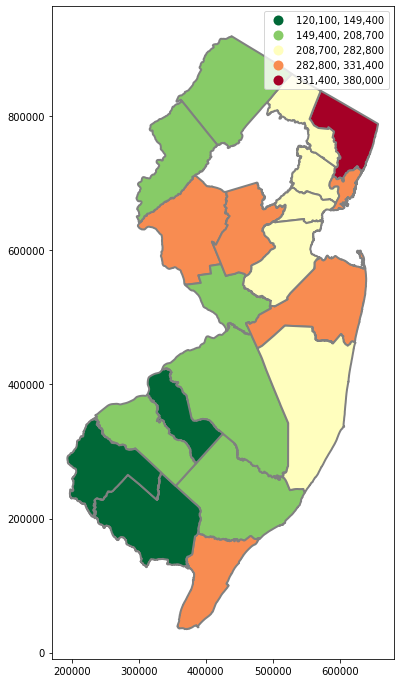

In [42]:
njC2.plot(figsize=(10,12),column='Dec 2012',legend=True,cmap='RdYlGn_r',
          scheme='natural_breaks',k=5, edgecolor='grey',linewidth=2,legend_kwds= {"fmt": "{:,.0f}"})

### foilum 
[TODO: expand, elaborate, polish]

its been around for some time; stable; i had no issues

In [ ]:
! pip install geocoder                                                                                       
from geopy.geocoders import Nominatim 

import folium as f                                                                     
from folium.plugins import MarkerCluster, HeatMap 

In [52]:
f.Map(location=[45.5236, -122.6750]) #open street map is default                            
#m.save('m7.html')                   
#webbrowser.get('firefox').open_new_tab('m.html') #; webbrowser.open('m.html')                   

In [53]:
geolocator = Nominatim()
location = geolocator.geocode("401 cooper st camden nj")
print(location.address)

401, Cooper Street, Downtown, Camden, Camden County, New Jersey, 08102, United States


In [54]:
print((location.latitude, location.longitude))

(39.94727470588235, -75.12232741176472)


In [56]:
place = geolocator.geocode("camden nj") #first geocode location                                          
place

Location(Camden, Camden County, New Jersey, United States, (39.9448402, -75.1198911, 0.0))

In [57]:
f.Map(location=place[1])

In [58]:
f.Map(location=place[1], tiles='Stamen Toner', zoom_start=16)

In [ ]:
f.Map(location=place[1], tiles='Stamen Terrain', zoom_start=6)

In [ ]:
###adding markup by hand--easy! good for few u/a                                                
m = f.Map(location=geolocator.geocode("401 cooper st camden nj")[1], zoom_start=14)
m.add_child(f.Marker(geolocator.geocode("401 cooper st camden nj 08120")[1], popup='DPPA'))
m.add_child(f.Marker(geolocator.geocode("321 cooper st camden nj 08102" )[1], popup='bbb'))
#m.add_child(f.CircleMarker(geolocator.geocode("waterfront camden nj")[1], popup='waterfront'))          


In [ ]:
'''can pick color, icon                                                                         
icons: http://www.w3schools.com/icons/bootstrap_icons_glyphicons.asp                            
colors: http://www.w3schools.com/colors/colors_names.asp                                        
'''
m = f.Map(location=geolocator.geocode("401 cooper st camden nj")[1], zoom_start=14)
m.add_child(f.Marker(geolocator.geocode("401 cooper st camden nj")[1],
                     popup='i love this place!',icon = f.Icon(icon = 'cloud' ,color = 'green')))
m.add_child(f.CircleMarker(geolocator.geocode("2 Riverside Dr, Camden, NJ 08103")[1], popup='waterfront'\
,color='#8A2BE2',fill_color='#F0F8FF'))
#m.save('m8.html')

In [ ]:
### many points, clustering, USEFUL! fancy!                                                     

#http://blog.dominodatalab.com/creating-interactive-crime-maps-with-folium/                     

!wget -q -O sfCrim.csv  https://raw.githubusercontent.com/devanshmanu/StravAdd/master/SFPD_Incidents_-_Current_Year__2015_.csv

sfCrim = pd.read_csv('sfCrim.csv')

len(sfCrim)

#crimedata[1:3]


112331

In [ ]:
sfCrim=sfCrim[0:1000] #for speed purposes                                                                             


In [ ]:
#create empty map zoomed in on San Francisco                                                    
m = f.Map(location=(37.76, -122.45), zoom_start=12)

loc = []
#add a marker for every record in the filtered data, use a clustered view                       
for each in sfCrim.iterrows():
    loc.append([each[1]['Y'],each[1]['X']])


loc[1:3]


m.add_children(MarkerCluster(locations=loc))
#m.save('m10.html')
#very cool! hover over it--pups u in blue a polygon that the aggregate refers to!               


<ipython-input-16-9cf9fc6d6a51>:13: FutureWarning: Method `add_children` is deprecated. Please use `add_child` instead.
  m.add_children(MarkerCluster(locations=loc))


In [ ]:
#now with crim popup
sanfran_map = f.Map(location = [37.76, -122.45], zoom_start = 12)

# instantiate a mark cluster object for the incidents in the dataframe
incidents = MarkerCluster().add_to(sanfran_map)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label, in zip(sfCrim.Y, sfCrim.X, sfCrim.Category):
    f.Marker(
        location=[lat, lng],
        icon=None,
        popup=label,
    ).add_to(incidents)

# display map
sanfran_map

In [ ]:
### heatmap http://www.jackboot7.com/visualizing-tweets.html                                    

m = f.Map(location=(37.76, -122.45), zoom_start=12)
m.add_children(HeatMap(loc))


<ipython-input-26-a64790162e58>:4: FutureWarning: Method `add_children` is deprecated. Please use `add_child` instead.
  m.add_children(HeatMap(loc))


#### polygons


In [ ]:
#adding geojson
map = f.Map()
map

In [ ]:
f.GeoJson('https://raw.githubusercontent.com/datasets/geo-admin1-us/master/data/admin1-us.geojson').add_to(map)
map

In [ ]:
url = (
    "https://raw.githubusercontent.com/python-visualization/folium/master/examples/data"
)
state_geo = f"{url}/us-states.json"
state_unemployment = f"{url}/US_Unemployment_Oct2012.csv"
state_data = pd.read_csv(state_unemployment)

In [ ]:
states = gpd.read_file(state_geo)
print(states.head())

   id        name                                           geometry
0  AL     Alabama  POLYGON ((-87.35930 35.00118, -85.60667 34.984...
1  AK      Alaska  MULTIPOLYGON (((-131.60202 55.11798, -131.5691...
2  AZ     Arizona  POLYGON ((-109.04250 37.00026, -109.04798 31.3...
3  AR    Arkansas  POLYGON ((-94.47384 36.50186, -90.15254 36.496...
4  CA  California  POLYGON ((-123.23326 42.00619, -122.37885 42.0...


In [ ]:
state_data.head(50)

,State,Unemployment
0,AL,7.1
1,AK,6.8
2,AZ,8.1
3,AR,7.2
4,CA,10.1
5,CO,7.7
6,CT,8.4
7,DE,7.1
8,FL,8.2
9,GA,8.8


In [ ]:
m = f.Map(location=[40, -95], zoom_start=4)
m

In [ ]:
f.Choropleth(
    geo_data=state_geo, #geo data obj: state_geo
    name="choropleth",
    data=state_data,   #regular data object
    columns=["State", "Unemployment"], # 1st var is join or merge var; 2nd is map var
    key_on="feature.id",  #this is merge/join var from geojson; just prefix ith 'feature
    fill_color="YlGnBu", #pick some color, opacities
    fill_opacity=0.7,
    line_opacity=.1,
    legend_name="Unemployment Rate (%)",
).add_to(m)

f.LayerControl().add_to(m)

m
#m.save('m2.html')

### leafmap

we list it as 2nd to leaflet as it does require more dependencies; also may be more buggy

lots of great functionality; easy to use

also interactive! almost like full blown gis soft like qgis: eg click on the right the toolbox and can do a ton of stuff incl open attr table etc (may need additional libraries like ipysheet)

In [102]:
!pip install leafmap
!pip install pycrs
!pip install geopandas 
!pip install osmnx
!pip install mapclassify

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [103]:
#ton of dependencies; also saying here which for what not to get lost
import leafmap
import pycrs #may be needed for some imported data such as shapefiles
import geopandas #may be needed to for some files such a kml
import osmnx #for geocoding, eg we geocode camden
import mapclassify #for thematic maps

In [19]:
#leafmap.basemaps.keys() #ton of possible basemaps

In [104]:
m = leafmap.Map(
    #google_map="ROADMAP", # ROADMAP HYBRID #change basemap
    center=(40, -100), zoom=4, height="400px", width="800px",
    #draw_control=False, #turn off controls
    #measure_control=False,
    #fullscreen_control=False,
    #attribution_control=True,
    )
#m.to_html("mymap.html")
m

Map(center=[40, -100], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_t…

In [68]:
#add geojson
m = leafmap.Map(center=[0, 0], zoom=2)
cou = "https://raw.githubusercontent.com/giswqs/leafmap/master/examples/data/countries.geojson"
cab = 'https://raw.githubusercontent.com/giswqs/leafmap/master/examples/data/cable_geo.geojson'
style = {
    "stroke": True,
    "color": "#0000ff",
    "weight": 2,
    "opacity": 1,
    "fill": True,
    "fillColor": "#0000ff",
    "fillOpacity": 0.1,
}
hover_style = {"fillOpacity": 0.7}
m.add_geojson(cou, layer_name="Countries", style=style, hover_style=hover_style)
m.add_geojson(cab, layer_name="Cable lines")
m

Map(center=[0, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text'…

In [64]:
#add shapefile
m = leafmap.Map(center=[0, 0], zoom=2)
in_shp = 'https://github.com/giswqs/leafmap/raw/master/examples/data/countries.zip'
m.add_shp(in_shp, layer_name="Countries")
m


/content/cache/shp/countries.zip already exists. Skip downloading. Set overwrite=True to overwrite.


Map(center=[0, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text'…

In [27]:
#add kml
m = leafmap.Map()
in_kml = 'https://raw.githubusercontent.com/giswqs/leafmap/master/examples/data/us_states.kml'
m.add_kml(in_kml, layer_name="US States KML")
m

us_states.kml already exists. Skip downloading. Set overwrite=True to overwrite.


Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

In [91]:
#can add csv straightup as long as have x y
m = leafmap.Map()
df = pd.read_csv('https://raw.githubusercontent.com/giswqs/leafmap/master/examples/data/us_cities.csv') #pandas
m.add_points_from_xy(df, x="longitude", y="latitude")
m
###straight from csv file:
#m = leafmap.Map()
#data = 'https://raw.githubusercontent.com/giswqs/leafmap/master/examples/data/us_cities.csv'
#m.add_points_from_xy(data, x="longitude", y="latitude")
#m

Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

In [30]:
#heatmap
m = leafmap.Map()
in_csv = "https://raw.githubusercontent.com/giswqs/leafmap/master/examples/data/world_cities.csv"
m.add_heatmap(
    in_csv,
    latitude="latitude",
    longitude='longitude',
    value="pop_max",
    name="Heat map",
    radius=15, #play with radius to achieve desired heat
)
colors = ['blue', 'lime', 'red']
vmin = 0
vmax = 10000
m.add_colorbar(colors=colors, vmin=vmin, vmax=vmax)
m.add_title("World Population Heat Map", font_size="20px", align="center")
m

The ipyleaflet map does not support titles.


Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

In [110]:
#thematic map
data = "https://raw.githubusercontent.com/giswqs/leafmap/master/examples/data/countries.geojson"
m = leafmap.Map()
m.add_data(
    data, column='POP_EST', scheme='Quantiles', cmap='Blues', legend_title='Population'
)
m
'''classification schemes:
BoxPlot
EqualInterval
FisherJenks
FisherJenksSampled
HeadTailBreaks
JenksCaspall
JenksCaspallForced
JenksCaspallSampled
MaxP
MaximumBreaks
NaturalBreaks
Quantiles
Percentiles
StdMean
UserDefined'''

Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

'classification schemes:\nBoxPlot\nEqualInterval\nFisherJenks\nFisherJenksSampled\nHeadTailBreaks\nJenksCaspall\nJenksCaspallForced\nJenksCaspallSampled\nMaxP\nMaximumBreaks\nNaturalBreaks\nQuantiles\nPercentiles\nStdMean\nUserDefined'

In [92]:
#geocode
m = leafmap.Map(toolbar_control=False, layers_control=True)
m.add_osm_from_geocode("Camden NJ", layer_name='Cam')
m

Map(center=[20, 0], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_text…

In [78]:
#add census data
for key in leafmap.get_census_dict():
    print(key)

Current
ACS 2021
ACS 2019
ACS 2018
ACS 2017
ACS 2016
ACS 2015
ACS 2014
ACS 2013
ACS 2012
ECON 2012
Census 2020
Census 2010
Physical Features
Decennial Census 2020
Decennial Census 2010
Decennial Census 2000
Decennial Physical Features


In [79]:
census_data_dict = leafmap.get_census_dict()
census_data_dict['Census 2020']['layers']

['Alaska_Native_Regional_Corporations10465',
 'Alaska_Native_Regional_Corporations_Labels60868',
 'Alaska_Native_Village_Statistical_Areas34178',
 'Alaska_Native_Village_Statistical_Areas_Labels14319',
 'American_Indian_Joint-Use_Areas11842',
 'American_Indian_Joint-Use_Areas_Labels32943',
 'Census_Block_Groups59805',
 'Census_Block_Groups_Labels32376',
 'Census_Blocks1978',
 'Census_Blocks_Labels63431',
 'Census_Designated_Places65166',
 'Census_Designated_Places_Labels61459',
 'Census_Divisions8578',
 'Census_Divisions_Labels29679',
 'Census_Regions16659',
 'Census_Regions_Labels31526',
 'Census_Tracts7651',
 'Census_Tracts_Labels33558',
 'Combined_New_England_City_and_Town_Areas35117',
 'Combined_New_England_City_and_Town_Areas_Labels20328',
 'Combined_Statistical_Areas61231',
 'Combined_Statistical_Areas_Labels52090',
 'Consolidated_Cities65047',
 'Consolidated_Cities_Labels30018',
 'Counties',
 'Counties_Labels19364',
 'County_Subdivisions63689',
 'County_Subdivisions_Labels25452'

In [88]:
m = leafmap.Map(zoom=5,center=[40,-90])
m.add_census_data(wms="Census 2020", layer="States")
m.add_census_data(wms="Census 2020", layer="States_Labels49388")
m
#or in toolbox click 9th icon Get US Census Data; need to zoom; and may not work (i had issues with some)

Map(center=[40, -90], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_out_te…

In [69]:
#vis land cover change #hit toolbar on the right, Layers, and turn on and off 2019
m = leafmap.Map(center=[36.1, -115.2],zoom=9)
m.add_basemap('NLCD 2001 CONUS Land Cover')
m.add_basemap('NLCD 2019 CONUS Land Cover')
m.add_legend(builtin_legend='NLCD')
m

Map(center=[36.1, -115.2], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'zoom_o…

In [125]:
#lidar WONT RUN IN COLAB, need other interpreter; or maybe other backend
#https://leafmap.org/notebooks/48_lidar/
#!pip install laspy[lazrs,laszip]
#!pip install leafmap[lidar] open3d

In [118]:
#url = 'https://github.com/giswqs/data/raw/main/lidar/madison.zip'
#filename = 'madison.las'
#if not os.path.exists(filename):
#    leafmap.download_file(url, 'madison.zip', unzip=True)

In [126]:
#las = leafmap.read_lidar(filename)
#las.header


In [127]:
#leafmap.view_lidar(filename, backend='open3d', background='white')

## satelite img

folium is just one library 

there are others, eg can get sat img straight to python, kind of similar like these APIs to Fed and World Bank we did earlier; eg check out these links:

https://carpentries-incubator.github.io/geospatial-python/05-access-data/

https://sites.northwestern.edu/researchcomputing/2021/11/19/downloading-satellite-images-made-easy/

## notes to myself

the whole course, geo dat sci:
https://darribas.org/gds_course/content/home.html

LATER:
 basemap! guess the first one! used to use it, but dead, depreciated in favor of cartopy
https://jakevdp.github.io/PythonDataScienceHandbook/04.13-geographic-data-with-basemap.html